<a href="https://colab.research.google.com/github/pranathiiyer/Comp-content-analysis-assignments/blob/main/Week_7_homework.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <font color="red">*Exercise 1*</font>

<font color="red">Construct cells immediately below this that estimate a deep classification model with LSTM and BERT in order to predict pre-established data labels relevant to your final project. Which works better? Are the errors the same or different?

<font color="red">***Stretch***</font>: <font color="red">Now alter the neural network by stacking network layers, adjusting the embedding dimension, compare its performance with your model above, and interpret why it might be different. Also consider whether you could use Seq2Seq in a similar way. Why or why not?

For this assignment, I use a data of labelled tweets which are labelled as misogynistic and non-misogynistic, and I use LSTM and BERT to see if the models can correctly classify the tweets. It does pretty well on LSTM, it has an accuracy of 95. And the BERT model gives a matthew coefficient of 0.0 which means it essentially is not able to do very well which could probably be because of the random nature of tweets and how bi-directional contexts could exist either way.

In [1]:
import torch # pip install torch
#! pip install transformers
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertConfig # pip install tranformers
from transformers import AdamW, BertForSequenceClassification
from tqdm import tqdm, trange
import pandas as pd
import io
import numpy as np
import matplotlib.pyplot as plt
#!pip install -U git+git://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git
import lucem_illud #pip install -U git+git://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

In [2]:
%matplotlib inline

In [3]:
import os
os.environ['KERAS_BACKEND'] = 'tensorflow'
from keras.preprocessing.sequence import pad_sequences

In [4]:
gpu = torch.cuda.is_available()

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if gpu:
    n_gpu = torch.cuda.device_count()
    torch.cuda.get_device_name(0)

In [6]:
device

device(type='cuda')

In [7]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/week-7/final_labels.csv')

In [8]:
df

,entry_id,link_id,parent_id,entry_utc,subreddit,author,body,image,label_date,week,group,sheet_order,level_1,level_2,level_3,strength,highlight,split
0,exoxn7,t3_exoxn7,NaN,1580652620,badwomensanatomy,doggodone,Do you have the skin of a 80 year old grandma?...,Yes,17-02-2020,1,1,"(1,)",Nonmisogynistic,None_of_the_categories,NaN,NaN,NaN,train
1,fgb3bdv,t3_exoxn7,t3_exoxn7,1580658139,badwomensanatomy,Machaeon,This is taking a grain of truth and extrapolat...,NaN,17-02-2020,1,1,"(1, 1)",Nonmisogynistic,None_of_the_categories,NaN,NaN,NaN,train
2,fgc6tlu,t3_exoxn7,t3_exoxn7,1580669695,badwomensanatomy,CuniculusVincitOmnia,Honestly my favorite thing about this is that ...,NaN,17-02-2020,1,1,"(1, 2)",Nonmisogynistic,None_of_the_categories,NaN,NaN,NaN,test
3,fge6msg,t3_exoxn7,t1_fgc6tlu,1580692566,badwomensanatomy,its331am,Source? Doesnt sound right to me idk,NaN,17-02-2020,1,1,"(1, 2, 1)",Nonmisogynistic,None_of_the_categories,NaN,NaN,NaN,test
4,fgawus5,t3_exoxn7,t3_exoxn7,1580656280,badwomensanatomy,JaxDefore,"Damn, I saw a movie in which the old woman bat...",NaN,17-02-2020,1,1,"(1, 3)",Misogynistic,Derogation,Moral_inferiority,Nature of the abuse is Implicit,old woman bathed in the blood if virgins,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6562,gleq7q,t3_gleq7q,NaN,1589719164,RedPillWomen,balletaurelie,Should I send my ex-boyfriends mom a thank you...,NaN,16-03-2020,11,1,"(26,)",Misogynistic,Misogynistic_pejorative,NaN,NaN,bitch,test
6563,fr2197x,t3_gm5ck5,t3_gm5ck5,1589829420,TheRedPill,Su_shii,"1. Whatever vibration you put out, you will at...",NaN,16-03-2020,11,1,"(43, 6)",Misogynistic,Misogynistic_pejorative,NaN,NaN,sluts,train
6564,fr2197x,t3_gm5ck5,t3_gm5ck5,1589829420,TheRedPill,Su_shii,"1. Whatever vibration you put out, you will at...",NaN,16-03-2020,11,1,"(43, 6)",Misogynistic,Misogynistic_pejorative,NaN,NaN,bitches,train
6565,fqujhe0,t3_gl0lgq,t1_fquf0b9,1589659929,Trufemcels,CrybabyOgress,>Please keep in mind that just because YOU vie...,NaN,16-03-2020,11,1,"(44, 2, 1)",Misogynistic,Misogynistic_pejorative,NaN,NaN,becky,train


In [8]:
sentences = df.body.values

# We need to add special tokens at the beginning and end of each sentence for BERT to work properly
sentences = ["[CLS] " + str(sentence) + " [SEP]" for sentence in sentences]
labels = []
for i in df.level_1.values:
  if i == 'Nonmisogynistic':
    labels.append(0)
  if i == 'Misogynistic':
    labels.append(1)
labels= pd.Series(labels)





In [9]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

tokenized_texts = [tokenizer.tokenize(sent) for sent in sentences]
print ("Tokenize the first sentence:")
print (tokenized_texts[0])

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Tokenize the first sentence:
['[CLS]', 'do', 'you', 'have', 'the', 'skin', 'of', 'a', '80', 'year', 'old', 'grandma', '?', 'worry', 'no', 'more', ',', 'just', 'drink', 'water', '!', '[SEP]']


In [10]:
# Set the maximum sequence length. The longest sequence in our training set is 47, but we'll leave room on the end anyway. 
# In the original paper, the authors used a length of 512.
MAX_LEN = 128

In [11]:
# Use the BERT tokenizer to convert the tokens to their index numbers in the BERT vocabulary
input_ids = [tokenizer.convert_tokens_to_ids(x) for x in tokenized_texts]

In [12]:
# Pad our input tokens
input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", truncating="post", padding="post")

In [13]:
# Create attention masks
attention_masks = []

# Create a mask of 1s for each token followed by 0s for padding
for seq in input_ids:
    seq_mask = [float(i>0) for i in seq]
    attention_masks.append(seq_mask)

In [15]:
# Use train_test_split to split our data into train and validation sets for training
train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels, 
                                                            random_state=2020, test_size=0.1)
train_masks, validation_masks, _, _ = train_test_split(attention_masks, input_ids,
                                             random_state=2020, test_size=0.1)

0

In [20]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Embedding

In [21]:
vocab_in_size = tokenizer.vocab_size
embedding_dim = 32
unit = 100
no_labels = len(np.unique(train_labels))
batch_size = 32

In [22]:
model_lstm = Sequential()
model_lstm.add(Embedding(vocab_in_size, embedding_dim, input_length=MAX_LEN))
model_lstm.add(LSTM(unit))
model_lstm.add(Dense(no_labels, activation='softmax'))
model_lstm.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model_lstm.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 128, 32)           976704    
                                                                 
 lstm (LSTM)                 (None, 100)               53200     
                                                                 
 dense (Dense)               (None, 2)                 202       
                                                                 
Total params: 1,030,106
Trainable params: 1,030,106
Non-trainable params: 0
_________________________________________________________________


In [24]:
history_lstm = model_lstm.fit(train_inputs, train_labels,batch_size=batch_size, epochs = 10, 
                              validation_data= (validation_inputs, validation_labels))

Epoch 1/10
185/185 [==============================] - 7s 36ms/step - loss: 0.2256 - accuracy: 0.9323 - val_loss: 0.2972 - val_accuracy: 0.9148
Epoch 2/10
185/185 [==============================] - 7s 38ms/step - loss: 0.1635 - accuracy: 0.9492 - val_loss: 0.3858 - val_accuracy: 0.9026
Epoch 3/10
185/185 [==============================] - 7s 38ms/step - loss: 0.2302 - accuracy: 0.9372 - val_loss: 0.3137 - val_accuracy: 0.8219
Epoch 4/10
185/185 [==============================] - 7s 37ms/step - loss: 0.1868 - accuracy: 0.9240 - val_loss: 0.2992 - val_accuracy: 0.9026
Epoch 5/10
185/185 [==============================] - 7s 38ms/step - loss: 0.1873 - accuracy: 0.9279 - val_loss: 0.3124 - val_accuracy: 0.8965
Epoch 6/10
185/185 [==============================] - 6s 35ms/step - loss: 0.1608 - accuracy: 0.9389 - val_loss: 0.3153 - val_accuracy: 0.8767
Epoch 7/10
185/185 [==============================] - 6s 34ms/step - loss: 0.1438 - accuracy: 0.9514 - val_loss: 0.3412 - val_accuracy: 0.8813

# Using BERT

In [25]:
train_labels = train_labels.reset_index(drop = True)

In [26]:


train_inputs = torch.tensor(train_inputs)
validation_inputs = torch.tensor(validation_inputs)
train_labels = torch.tensor(pd.Series(train_labels))
validation_labels = torch.tensor(validation_labels.values)
train_masks = torch.tensor(train_masks)
validation_masks = torch.tensor(validation_masks)



In [27]:
# Select a batch size for training. For fine-tuning BERT on a specific task, the authors recommend a batch size of 16 or 32
batch_size = 32

# Create an iterator of our data with torch DataLoader. This helps save on memory during training because, unlike a for loop, 
# with an iterator the entire dataset does not need to be loaded into memory

train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
validation_sampler = SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=batch_size)

In [28]:
torch.cuda.empty_cache() 

In [29]:
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=2)
model.cuda()

Downloading:   0%|          | 0.00/420M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [30]:
model

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [31]:
param_optimizer = list(model.named_parameters())
no_decay = ['bias', 'gamma', 'beta']
optimizer_grouped_parameters = [
    {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)],
     'weight_decay_rate': 0.01},
    {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)],
     'weight_decay_rate': 0.0}
]


In [32]:
# This variable contains all of the hyperparemeter information our training loop needs
optimizer = AdamW(model.parameters(),
                  lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                  eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                )

In [33]:
from transformers import get_linear_schedule_with_warmup

# Number of training epochs (authors recommend between 2 and 4)
epochs = 4

# Total number of training steps is number of batches * number of epochs.
total_steps = len(train_dataloader) * epochs

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps = 0, # Default value in run_glue.py
                                            num_training_steps = total_steps)

In [34]:
# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

In [35]:
import time
import datetime

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

In [36]:
import random

# This training code is based on the `run_glue.py` script here:
# https://github.com/huggingface/transformers/blob/5bfcd0485ece086ebcbed2d008813037968a9e58/examples/run_glue.py#L128

# Set the seed value all over the place to make this reproducible.
seed_val = 42

random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

# Store the average loss after each epoch so we can plot them.
loss_values = []

# For each epoch...
for epoch_i in range(0, epochs):
    
    # ========================================
    #               Training
    # ========================================
    
    # Perform one full pass over the training set.

    print("")
    print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
    print('Training...')

    # Measure how long the training epoch takes.
    t0 = time.time()

    # Reset the total loss for this epoch.
    total_loss = 0

    # Put the model into training mode. Don't be mislead--the call to 
    # `train` just changes the *mode*, it doesn't *perform* the training.
    # `dropout` and `batchnorm` layers behave differently during training
    # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
    model.train()

    # For each batch of training data...
    for step, batch in enumerate(train_dataloader):

        # Progress update every 40 batches.
        if step % 40 == 0 and not step == 0:
            # Calculate elapsed time in minutes.
            elapsed = format_time(time.time() - t0)
            
            # Report progress.
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))

        # Unpack this training batch from our dataloader. 
        #
        # As we unpack the batch, we'll also copy each tensor to the GPU using the 
        # `to` method.
        #
        # `batch` contains three pytorch tensors:
        #   [0]: input ids 
        #   [1]: attention masks
        #   [2]: labels 
        b_input_ids = batch[0].to(device)
        b_input_mask = batch[1].to(device)
        b_labels = batch[2].to(device)

        # Always clear any previously calculated gradients before performing a
        # backward pass. PyTorch doesn't do this automatically because 
        # accumulating the gradients is "convenient while training RNNs". 
        # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
        model.zero_grad()        

        # Perform a forward pass (evaluate the model on this training batch).
        # This will return the loss (rather than the model output) because we
        # have provided the `labels`.
        # The documentation for this `model` function is here: 
        # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
        outputs = model(b_input_ids, 
                    token_type_ids=None, 
                    attention_mask=b_input_mask, 
                    labels=b_labels)
        
        # The call to `model` always returns a tuple, so we need to pull the 
        # loss value out of the tuple.
        loss = outputs[0]

        # Accumulate the training loss over all of the batches so that we can
        # calculate the average loss at the end. `loss` is a Tensor containing a
        # single value; the `.item()` function just returns the Python value 
        # from the tensor.
        total_loss += loss.item()

        # Perform a backward pass to calculate the gradients.
        loss.backward()

        # Clip the norm of the gradients to 1.0.
        # This is to help prevent the "exploding gradients" problem.
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        # Update parameters and take a step using the computed gradient.
        # The optimizer dictates the "update rule"--how the parameters are
        # modified based on their gradients, the learning rate, etc.
        optimizer.step()

        # Update the learning rate.
        scheduler.step()

    # Calculate the average loss over the training data.
    avg_train_loss = total_loss / len(train_dataloader)            
    
    # Store the loss value for plotting the learning curve.
    loss_values.append(avg_train_loss)

    print("")
    print("  Average training loss: {0:.2f}".format(avg_train_loss))
    print("  Training epcoh took: {:}".format(format_time(time.time() - t0)))
        
    # ========================================
    #               Validation
    # ========================================
    # After the completion of each training epoch, measure our performance on
    # our validation set.

    print("")
    print("Running Validation...")

    t0 = time.time()

    # Put the model in evaluation mode--the dropout layers behave differently
    # during evaluation.
    model.eval()

    # Tracking variables 
    eval_loss, eval_accuracy = 0, 0
    nb_eval_steps, nb_eval_examples = 0, 0

    # Evaluate data for one epoch
    for batch in validation_dataloader:
        
        # Add batch to GPU
        batch = tuple(t.to(device) for t in batch)
        
        # Unpack the inputs from our dataloader
        b_input_ids, b_input_mask, b_labels = batch
        
        # Telling the model not to compute or store gradients, saving memory and
        # speeding up validation
        with torch.no_grad():        

            # Forward pass, calculate logit predictions.
            # This will return the logits rather than the loss because we have
            # not provided labels.
            # token_type_ids is the same as the "segment ids", which 
            # differentiates sentence 1 and 2 in 2-sentence tasks.
            # The documentation for this `model` function is here: 
            # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
            outputs = model(b_input_ids, 
                            token_type_ids=None, 
                            attention_mask=b_input_mask)
        
        # Get the "logits" output by the model. The "logits" are the output
        # values prior to applying an activation function like the softmax.
        logits = outputs[0]

        # Move logits and labels to CPU
        logits = logits.detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()
        
        # Calculate the accuracy for this batch of test sentences.
        tmp_eval_accuracy = flat_accuracy(logits, label_ids)
        
        # Accumulate the total accuracy.
        eval_accuracy += tmp_eval_accuracy

        # Track the number of batches
        nb_eval_steps += 1

    # Report the final accuracy for this validation run.
    print("  Accuracy: {0:.2f}".format(eval_accuracy/nb_eval_steps))
    print("  Validation took: {:}".format(format_time(time.time() - t0)))

print("")
print("Training complete!")


======== Epoch 1 / 4 ========
Training...
  Batch    40  of    185.    Elapsed: 0:00:52.
  Batch    80  of    185.    Elapsed: 0:01:45.
  Batch   120  of    185.    Elapsed: 0:02:37.
  Batch   160  of    185.    Elapsed: 0:03:29.

  Average training loss: 0.27
  Training epcoh took: 0:04:01

Running Validation...
  Accuracy: 0.92
  Validation took: 0:00:10

======== Epoch 2 / 4 ========
Training...
  Batch    40  of    185.    Elapsed: 0:00:52.
  Batch    80  of    185.    Elapsed: 0:01:44.
  Batch   120  of    185.    Elapsed: 0:02:36.
  Batch   160  of    185.    Elapsed: 0:03:28.

  Average training loss: 0.15
  Training epcoh took: 0:04:01

Running Validation...
  Accuracy: 0.93
  Validation took: 0:00:10

======== Epoch 3 / 4 ========
Training...
  Batch    40  of    185.    Elapsed: 0:00:52.
  Batch    80  of    185.    Elapsed: 0:01:44.
  Batch   120  of    185.    Elapsed: 0:02:36.
  Batch   160  of    185.    Elapsed: 0:03:28.

  Average training loss: 0.08
  Training epcoh t

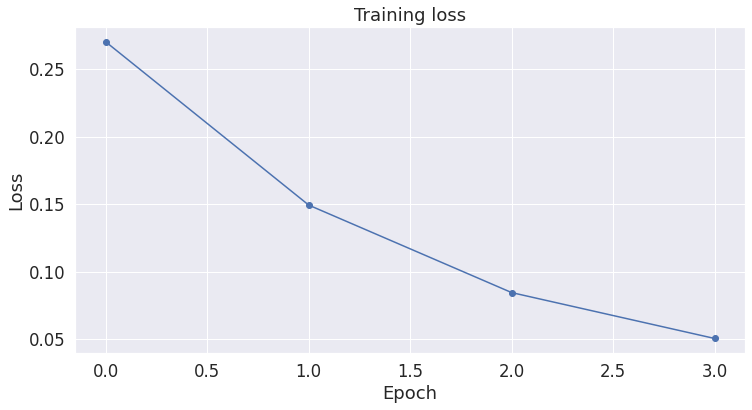

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

# Use plot styling from seaborn.
sns.set(style='darkgrid')

# Increase the plot size and font size.
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

# Plot the learning curve.
plt.plot(loss_values, 'b-o')

# Label the plot.
plt.title("Training loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.show()

In [38]:
import pandas as pd

# Load the dataset into a pandas dataframe.
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/week-7/final_labels.csv')
# Report the number of sentences.
print('Number of test sentences: {:,}\n'.format(df.shape[0]))
df.dropna(how = 'any', inplace = True)
# Create sentence and label lists
sentences = df.body.values


labels = []
for i in df.level_1.values:
  if i == 'Nonmisogynistic':
    labels.append(0)
  if i == 'Misogynistic':
    labels.append(1)
labels= pd.Series(labels)
# Tokenize all of the sentences and map the tokens to thier word IDs.
input_ids = []

# For every sentence...
for sent in sentences:
  
    # `encode` will:
    #   (1) Tokenize the sentence.
    #   (2) Prepend the `[CLS]` token to the start.
    #   (3) Append the `[SEP]` token to the end.
    #   (4) Map tokens to their IDs.
    
    encoded_sent = tokenizer.encode(
                        sent,                      # Sentence to encode.
                        add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                   )
    
    
    input_ids.append(encoded_sent)

# Pad our input tokens
input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, 
                          dtype="long", truncating="post", padding="post")

# Create attention masks
attention_masks = []

# Create a mask of 1s for each token followed by 0s for padding
for seq in input_ids:
    seq_mask = [float(i>0) for i in seq]
    attention_masks.append(seq_mask) 

# Convert to tensors.
prediction_inputs = torch.tensor(input_ids)
prediction_masks = torch.tensor(attention_masks)
prediction_labels = torch.tensor(labels)

# Set the batch size.  
batch_size = 32  

# Create the DataLoader.
prediction_data = TensorDataset(prediction_inputs, prediction_masks, prediction_labels)
prediction_sampler = SequentialSampler(prediction_data)
prediction_dataloader = DataLoader(prediction_data, sampler=prediction_sampler, batch_size=batch_size)

Number of test sentences: 6,567



In [39]:
# Prediction on test set

print('Predicting labels for {:,} test sentences...'.format(len(prediction_inputs)))

# Put model in evaluation mode
model.eval()

# Tracking variables 
predictions , true_labels = [], []

# Predict 
for batch in prediction_dataloader:
    # Add batch to GPU
    batch = tuple(t.to(device) for t in batch)

    # Unpack the inputs from our dataloader
    b_input_ids, b_input_mask, b_labels = batch

    # Telling the model not to compute or store gradients, saving memory and 
    # speeding up prediction
    with torch.no_grad():
      # Forward pass, calculate logit predictions
      outputs = model(b_input_ids, token_type_ids=None, 
                      attention_mask=b_input_mask)

    logits = outputs[0]

    # Move logits and labels to CPU
    logits = logits.detach().cpu().numpy()
    label_ids = b_labels.to('cpu').numpy()

    # Store predictions and true labels
    predictions.append(logits)
    true_labels.append(label_ids)

print('    DONE.')

Predicting labels for 2 test sentences...
    DONE.


In [40]:
from sklearn.metrics import matthews_corrcoef

matthews_set = []

# Evaluate each test batch using Matthew's correlation coefficient
print('Calculating Matthews Corr. Coef. for each batch...')

# For each input batch...
for i in range(len(true_labels)):

    # The predictions for this batch are a 2-column ndarray (one column for "0" 
    # and one column for "1"). Pick the label with the highest value and turn this
    # in to a list of 0s and 1s.
    pred_labels_i = np.argmax(predictions[i], axis=1).flatten()

    # Calculate and store the coef for this batch.  
    matthews = matthews_corrcoef(true_labels[i], pred_labels_i)                
    matthews_set.append(matthews)

Calculating Matthews Corr. Coef. for each batch...


In [41]:
matthews_set

[0.0]

In [42]:
# Combine the predictions for each batch into a single list of 0s and 1s.
flat_predictions = [item for sublist in predictions for item in sublist]
flat_predictions = np.argmax(flat_predictions, axis=1).flatten()

# Combine the correct labels for each batch into a single list.
flat_true_labels = [item for sublist in true_labels for item in sublist]

# Calculate the MCC
mcc = matthews_corrcoef(flat_true_labels, flat_predictions)

print('MCC: %.3f' % mcc)

MCC: 0.000


In [43]:
import os

# Saving best-practices: if you use defaults names for the model, you can reload it using from_pretrained()

output_dir = '/content/drive/MyDrive/Colab Notebooks/model_save/model_1'

# Create output directory if needed
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

print("Saving model to %s" % output_dir)

# Save a trained model, configuration and tokenizer using `save_pretrained()`.
# They can then be reloaded using `from_pretrained()`
model_to_save = model.module if hasattr(model, 'module') else model  # Take care of distributed/parallel training
model_to_save.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)

# Good practice: save your training arguments together with the trained model
# torch.save(args, os.path.join(output_dir, 'training_args.bin'))

Saving model to /content/drive/MyDrive/Colab Notebooks/model_save/model_1


('/content/drive/MyDrive/Colab Notebooks/model_save/model_1/tokenizer_config.json',
 '/content/drive/MyDrive/Colab Notebooks/model_save/model_1/special_tokens_map.json',
 '/content/drive/MyDrive/Colab Notebooks/model_save/model_1/vocab.txt',
 '/content/drive/MyDrive/Colab Notebooks/model_save/model_1/added_tokens.json')

## <font color="red">*Exercise 2*</font>
<font color="red">Construct cells immediately below this that visualize your BERT model with the `bertviz` and/or `ecco` packages. There is also a similar tool called [`exbert`](https://huggingface.co/exbert/?model=distilgpt2&modelKind=bidirectional&sentence=The%20girl%20ran%20to%20a%20local%20pub%20to%20escape%20the%20din%20of%20her%20city.&layer=0&heads=..0,1,2,3,4,5,6,7,8,9,10,11&threshold=0.7&tokenInd=null&tokenSide=null&maskInds=..&hideClsSep=true) that may be of interest.

I create visuals for two sentences "Are you a a woman?" and "Are you a bitch?" since the word bitch appears a lot of times in the tweets that are classified as misogynistic. And the results can be seen in the visuals below.

In [58]:
from transformers import BertModel

In [59]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [60]:
text = "Here is the sentence I want embeddings for."
marked_text = "[CLS] " + text + " [SEP]"

# Tokenize our sentence with the BERT tokenizer.
tokenized_text = tokenizer.tokenize(marked_text)

# Print out the tokens.
print (tokenized_text)

['[CLS]', 'here', 'is', 'the', 'sentence', 'i', 'want', 'em', '##bed', '##ding', '##s', 'for', '.', '[SEP]']


In [61]:
!pip install bertviz

     |████████████████████████████████| 155 kB 5.5 MB/s 
     |████████████████████████████████| 1.2 MB 19.1 MB/s 


In [72]:
# Load model and retrieve attention weights

from bertviz import head_view, model_view
from transformers import BertTokenizer, BertModel

model_version = './model_save/model_1'
do_lower_case = True
model = BertModel.from_pretrained(model_version, output_attentions=True)

tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
sentence_a = "Are you a woman?"
sentence_b = "Are you a bitch?"
inputs = tokenizer.encode_plus(sentence_a, sentence_b, return_tensors='pt', add_special_tokens=True)
input_ids = inputs['input_ids']
token_type_ids = inputs['token_type_ids']
attention = model(input_ids, token_type_ids=token_type_ids)[-1]
sentence_b_start = token_type_ids[0].tolist().index(1)
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer.convert_ids_to_tokens(input_id_list) 

In [73]:
head_view(attention, tokens, sentence_b_start)

<IPython.core.display.Javascript object>

In [74]:
from bertviz.transformers_neuron_view import BertModel, BertTokenizer
from bertviz.neuron_view import show

model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
model_type = 'bert'
show(model, model_type, tokenizer, sentence_a, sentence_b, layer=2, head=0)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## <font color="red">*Exercise 3*</font>

<font color="red">In the cells immediately following, use the pipeline functions or the word or sentence vector functions (e.g., similarity) to explore the social game underlying the production and meaning of texts associated with your final project. This may be similar to what you did in Week 5, but try to make use of new things you've learned since then. How does BERT help you gain insight regarding your research question that is similar and different from prior methods?

BERT was not able to do a very good job with masking or the model was not fine tuned properly because the results do not make a lot of sense. Since the number of tweets in my dataset is only 6000 and the existing BERT model is trained over millions of sentences, the mdoel does not do too well. However, if the model was fine tuned properly with a lot more tweets, it could do a much better job.

In [16]:
from transformers import pipeline
nlp = pipeline("fill-mask")

No model was supplied, defaulted to distilroberta-base (https://huggingface.co/distilroberta-base)


Downloading:   0%|          | 0.00/480 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/316M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

In [63]:
from transformers import AutoModelWithLMHead, AutoTokenizer
import torch
tokenizer = AutoTokenizer.from_pretrained("/content/drive/MyDrive/Colab Notebooks/model_save/model_1")
model = AutoModelWithLMHead.from_pretrained("/content/drive/MyDrive/Colab Notebooks/model_save/model_1")
sequence = f"Women candidates must think about {tokenizer.mask_token} in the elections."
input = tokenizer.encode(sequence, return_tensors="pt")
mask_token_index = torch.where(input == tokenizer.mask_token_id)[1]
token_logits = model(input).logits
mask_token_logits = token_logits[0, mask_token_index, :]
top_5_tokens = torch.topk(mask_token_logits, 5, dim=1).indices[0].tolist()

Some weights of the model checkpoint at /content/drive/MyDrive/Colab Notebooks/model_save/model_1 were not used when initializing BertForMaskedLM: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForMaskedLM were not initialized from the model checkpoint at /content/drive/MyDrive/Colab Notebooks/model_save/model_1 and are newly initialized: ['cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weig

In [64]:
for token in top_5_tokens:
    print(sequence.replace(tokenizer.mask_token, tokenizer.decode([token])))

Women candidates must think about ##ailed in the elections.
Women candidates must think about ##nivorous in the elections.
Women candidates must think about ##erved in the elections.
Women candidates must think about ##jected in the elections.
Women candidates must think about ##orestation in the elections.


In [65]:
from transformers import AutoModelWithLMHead, AutoTokenizer, top_k_top_p_filtering
import torch
from torch.nn import functional as F
tokenizer = AutoTokenizer.from_pretrained("/content/drive/MyDrive/Colab Notebooks/model_save/model_1")
model = AutoModelWithLMHead.from_pretrained("/content/drive/MyDrive/Colab Notebooks/model_save/model_1")
sequence = f"Women must think of their participation as "
input_ids = tokenizer.encode(sequence, return_tensors="pt")
# get logits of last hidden state
next_token_logits = model(input_ids).logits[:, -1, :]
# filter
filtered_next_token_logits = top_k_top_p_filtering(next_token_logits, top_k=50, top_p=1.0)
# sample
probs = F.softmax(filtered_next_token_logits, dim=-1)
next_token = torch.multinomial(probs, num_samples=1)
generated = torch.cat([input_ids, next_token], dim=-1)
resulting_string = tokenizer.decode(generated.tolist()[0])

Downloading:   0%|          | 0.00/665 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/0.99M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/523M [00:00<?, ?B/s]

In [1]:
print(resulting_string) # the output is not visible since collab crashed and I could not rerun it, but I did run it and
# it did not do any better than the previous approach

NameError: ignored